In [7]:
!git clone https://github.com/clausmichele/CBSD68-dataset.git

Cloning into 'CBSD68-dataset'...
remote: Enumerating objects: 564, done.
remote: Total 564 (delta 0), reused 0 (delta 0), pack-reused 564 (from 1)
Receiving objects: 100% (564/564), 181.30 MiB | 18.62 MiB/s, done.
Resolving deltas: 100% (2/2), done.


In [8]:
import os
import time
import random
import gc
import re
import numpy as np
from sklearn.model_selection import train_test_split
from skimage.metrics import structural_similarity as SSIM
from skimage.metrics import peak_signal_noise_ratio as PSNR
import matplotlib.pyplot as plt
from keras import backend as K
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import (Dropout, Conv2D, Input, MaxPool2D, UpSampling2D, Conv2DTranspose, Concatenate, Activation, ReLU,
                                     GroupNormalization, LayerNormalization, BatchNormalization)
from tensorflow.keras.models import Model
from tensorflow.keras import layers, models, Model
from PIL import Image
import PIL
import PIL.Image
import pathlib
import wandb
from wandb.integration.keras import WandbMetricsLogger, WandbModelCheckpoint, WandbCallback

In [9]:
def load_images_to_array(folder_path):
    image_list = []
    filenames = []

    for filename in os.listdir(folder_path):
        if filename.endswith(('.png')):
            filenames.append(int(filename[:-4]))

    filenames.sort()

    for filename in filenames:
        img_path = os.path.join(folder_path, "0"*(4-len(str(filename))) + str(filename) + ".png")
        img = Image.open(img_path)
        img_array = np.array(img)
        if img_array.shape != (321, 481, 3):
            img_array = np.transpose(img_array, (1, 0, 2))[:, ::-1, :]
        img_array = img_array[1:, 1:]
        image_list.append(img_array)

    image_list = np.array(image_list)
    image_list = image_list.astype('float32') / 255.0
    return image_list

In [10]:
blurry_path = "CBSD68-dataset/CBSD68/noisy35"
blurry_images_dataset = load_images_to_array(blurry_path)
original_path = "CBSD68-dataset/CBSD68/original_png"
original_images_dataset = load_images_to_array(original_path)
blurry_images_dataset.shape, original_images_dataset.shape

((68, 320, 480, 3), (68, 320, 480, 3))

In [11]:
def augment_images(blurry, original, data_augmentation):
    combined = tf.concat([blurry, original], axis=-1)
    augmented = data_augmentation(combined)
    blurry_aug = augmented[..., :3]
    original_aug = augmented[..., 3:]
    return blurry_aug, original_aug

aug_blurry_list = []
aug_original_list = []

for _ in range(1):
    dataset = tf.data.Dataset.from_tensor_slices((blurry_images_dataset, original_images_dataset))

    for blurry, original in zip(blurry_images_dataset, original_images_dataset):
        blurry_aug, original_aug = augment_images(blurry, original, tf.image.flip_left_right)
        aug_blurry_list.append(blurry_aug.numpy())
        aug_original_list.append(original_aug.numpy())

        blurry_aug, original_aug = augment_images(blurry, original, tf.image.random_flip_up_down)
        aug_blurry_list.append(blurry_aug.numpy())
        aug_original_list.append(original_aug.numpy())

aug_blurry_np = np.array(aug_blurry_list)
aug_original_np = np.array(aug_original_list)

aug_blurry_np.shape, aug_original_np.shape

((136, 320, 480, 3), (136, 320, 480, 3))

In [12]:
blurry_images = np.concatenate([aug_blurry_np, blurry_images_dataset], axis=0)
original_images = np.concatenate([aug_original_np, original_images_dataset], axis=0)
blurry_images.shape, original_images.shape

((204, 320, 480, 3), (204, 320, 480, 3))

In [13]:
SEED = 3
def set_random_seed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
set_random_seed()
X_train, X_test, y_train, y_test = train_test_split(blurry_images, original_images, test_size=0.2, random_state=SEED)

In [14]:
def get_model_unet(input_shape=(320, 480, 3),
                   conv_filt=64,
                   kernel_size=3,
                   activation="relu",
                   padding="same",
                   pool_size=2,
                   norm_layer="layer"):
    conv_args = {
        "kernel_size": kernel_size,
        "activation": activation,
        "padding": padding,
    }

    inputs = Input(shape=input_shape)

    def apply_norm(x):
        if norm_layer == "layer":
            return LayerNormalization()(x)
        if norm_layer == "group":
            return GroupNormalization(groups=16)(x)
        if norm_layer == "instance":
            return GroupNormalization(groups=-1)(x) # see https://keras.io/api/layers/normalization_layers/group_normalization/
        return BatchNormalization()(x)

    x = Conv2D(conv_filt, **conv_args)(inputs)
    x = apply_norm(x)
    x = Conv2D(conv_filt, **conv_args)(x)
    x = apply_norm(x)
    skip1 = x
    x = MaxPool2D(pool_size)(x)

    x = Conv2D(conv_filt * 2, **conv_args)(x)
    x = apply_norm(x)
    x = Conv2D(conv_filt * 4, **conv_args)(x)
    x = apply_norm(x)
    skip2 = x
    x = MaxPool2D(pool_size)(x)

    x = Conv2D(conv_filt * 2, **conv_args)(x)
    x = apply_norm(x)
    x = Conv2D(conv_filt * 4, **conv_args)(x)
    x = apply_norm(x)

    x = UpSampling2D(size=pool_size)(x)
    x = Concatenate()([skip2, x])
    x = Conv2D(conv_filt * 2, **conv_args)(x)
    x = apply_norm(x)
    x = Conv2D(conv_filt * 2, **conv_args)(x)
    x = apply_norm(x)

    x = UpSampling2D(size=pool_size)(x)
    x = Concatenate()([skip1, x])
    x = Conv2D(conv_filt, **conv_args)(x)
    x = apply_norm(x)
    x = Conv2D(conv_filt, **conv_args)(x)
    x = apply_norm(x)

    outputs = Conv2D(3, kernel_size=1, activation="sigmoid")(x)

    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

In [15]:
sweep_config = {
    'method': 'grid',
    'metric': {
        'name': 'ssim',
        'goal': 'maximize'
    },
    'parameters': {
        'batch_size': {'values': [4]},
        'epoch': {'values': [40]},
        'loss': {'values': ['mse', 'mae']},
        'optimizer': {'values': ['adam']},
        'norm_layer': {'values': ['layer', 'instance', 'group', 'batch']}
    }
}

sweep_id = wandb.sweep(sweep_config, project="denoising_using_unet")

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: kw3ef746
Sweep URL: https://wandb.ai/aditya-workspace10-manipal-university/denoising_using_unet/sweeps/kw3ef746


In [16]:
def psnr_metric(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim_metric(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

In [18]:
l = []

def train():
    wandb.init()
    config = wandb.config

    model = get_model_unet(norm_layer=config.norm_layer)
    model.compile(
        optimizer=config.optimizer,
        loss=config.loss,
        metrics=[psnr_metric, ssim_metric]
    )

    model.fit(
        x=X_train, y=y_train,
        epochs=config.epoch,
        batch_size=config.batch_size,
        validation_data=(X_test, y_test),
        callbacks=[WandbMetricsLogger(log_freq=1)]
    )

    final_val_psnr = wandb.run.summary.get('epoch/val_psnr_metric')
    final_val_ssim = wandb.run.summary.get('epoch/val_ssim_metric')
    final_train_psnr = wandb.run.summary.get('epoch/psnr_metric')
    final_train_ssim = wandb.run.summary.get('epoch/ssim_metric')

    model.save(f"model-{wandb.run.id}.h5")
    metrics = [wandb.run.id, config.loss, config.norm_layer, final_val_psnr, final_val_ssim, final_train_psnr, final_train_ssim]
    print(metrics)
    l.append(metrics)

    wandb.finish()

wandb.agent(sweep_id, function=train)

wandb: Agent Starting Run: kickosjl with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mse
wandb: 	norm_layer: layer
wandb: 	optimizer: adam
wandb: Currently logged in as: aditya-workspace10 (aditya-workspace10-manipal-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 122s 2s/step - loss: 0.1198 - psnr_metric: 9.9908 - ssim_metric: 0.2394 - val_loss: 0.0563 - val_psnr_metric: 13.1548 - val_ssim_metric: 0.3825
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 45s 437ms/step - loss: 0.0483 - psnr_metric: 14.0312 - ssim_metric: 0.4134 - val_loss: 0.0159 - val_psnr_metric: 18.6998 - val_ssim_metric: 0.5961
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 445ms/step - loss: 0.0104 - psnr_metric: 20.2411 - ssim_metric: 0.6129 - val_loss: 0.0065 - val_psnr_metric: 22.2910 - val_ssim_metric: 0.6564
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 439ms/step - loss: 0.0070 - psnr_metric: 22.0800 - ssim_metric: 0.6489 - val_loss: 0.0071 - val_psnr_metric: 21.7362 - val_ssim_metric: 0.6651
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 434ms/step - loss: 0.0056 - psnr_metric: 22.8231 - ssim_metric: 0.6704 - val_loss: 0.0077 - val_psnr_metric: 21.3294 - val_ssim_metric: 0.6701
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 436ms/step - loss: 0.0054 - psnr_met

['kickosjl', 'mse', 'layer', 26.913795471191406, 0.7567284107208252, 27.085411071777344, 0.7570396661758423]


batch/batch_step,▁▁▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇█████
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,██▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/psnr_metric,▁▂▂▃▃▆▆▆▇▇▇▇▇▇▇▇█████████████▇███████▇██
batch/ssim_metric,▁▃▆▆▇▆▇▇▇▇▇▇▇▇▇▇█▇██████████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/psnr_metric,▁▃▅▆▆▆▇▇▇▇▇▇▇▇▇█████████████████████████
epoch/ssim_metric,▁▄▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██████████████████
epoch/val_loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: pvnclp9m with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mse
wandb: 	norm_layer: instance
wandb: 	optimizer: adam


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 42s 697ms/step - loss: 0.0462 - psnr_metric: 14.3703 - ssim_metric: 0.3424 - val_loss: 0.0203 - val_psnr_metric: 17.5932 - val_ssim_metric: 0.5904
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 0.0209 - psnr_metric: 17.4640 - ssim_metric: 0.5708 - val_loss: 0.0164 - val_psnr_metric: 18.7159 - val_ssim_metric: 0.6070
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 19s 425ms/step - loss: 0.0167 - psnr_metric: 18.5307 - ssim_metric: 0.5953 - val_loss: 0.0138 - val_psnr_metric: 19.5073 - val_ssim_metric: 0.6179
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 417ms/step - loss: 0.0141 - psnr_metric: 19.3009 - ssim_metric: 0.6105 - val_loss: 0.0134 - val_psnr_metric: 19.4281 - val_ssim_metric: 0.6266
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 418ms/step - loss: 0.0132 - psnr_metric: 19.5937 - ssim_metric: 0.6169 - val_loss: 0.0117 - val_psnr_metric: 20.1482 - val_ssim_metric: 0.6334
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 18s 447ms/step - loss: 0.0124 - psnr_

['pvnclp9m', 'mse', 'instance', 19.420351028442383, 0.622981607913971, 19.105331420898438, 0.6150186061859131]


batch/batch_step,▁▁▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇████
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,██▆▇▅▄▄▄▄▄▃▃▂▃▂▂▂▂▂▂▂▂▁▁▁▁▂▁▁▁▁▂▂▁▁▁▄█▇▆
batch/psnr_metric,▂▃▃▃▃▃▄▄▄▄▄▅▄▅▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▅▇▇▇█▇██▇▅▁
batch/ssim_metric,▁▄▅▅▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████████▇
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▃▄
epoch/psnr_metric,▁▃▃▄▄▄▅▅▄▅▅▆▆▆▆▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███▄▄
epoch/ssim_metric,▁▄▅▅▅▅▆▆▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇█▇█████▆▅
epoch/val_loss,▇▆▅▄▄▄▄▃▄▄▃▃▂▂▃▃▂▂▂▂▂▂▂▂▁▁▂▁▂▁▂▂▁▁▁▁▁▁█▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 46d9452h with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mse
wandb: 	norm_layer: group
wandb: 	optimizer: adam


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 41s 697ms/step - loss: 0.0484 - psnr_metric: 14.6004 - ssim_metric: 0.3776 - val_loss: 0.0166 - val_psnr_metric: 18.2344 - val_ssim_metric: 0.6077
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 417ms/step - loss: 0.0139 - psnr_metric: 19.3326 - ssim_metric: 0.6112 - val_loss: 0.0088 - val_psnr_metric: 21.1119 - val_ssim_metric: 0.6559
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 412ms/step - loss: 0.0092 - psnr_metric: 21.0218 - ssim_metric: 0.6457 - val_loss: 0.0083 - val_psnr_metric: 21.4891 - val_ssim_metric: 0.6700
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 410ms/step - loss: 0.0084 - psnr_metric: 21.4009 - ssim_metric: 0.6611 - val_loss: 0.0065 - val_psnr_metric: 22.3381 - val_ssim_metric: 0.6771
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 18s 436ms/step - loss: 0.0063 - psnr_metric: 22.3721 - ssim_metric: 0.6674 - val_loss: 0.0090 - val_psnr_metric: 20.9393 - val_ssim_metric: 0.6699
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 19s 406ms/step - loss: 0.0068 - psnr_

['46d9452h', 'mse', 'group', 27.318281173706055, 0.7728859782218933, 27.515384674072266, 0.7741891741752625]


batch/batch_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇█████
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,█▃▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/psnr_metric,▁▃▃▅▄▄▅▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇██████▇████▇▇█████
batch/ssim_metric,▁▂▂▆▆▆▆▆▆▇▆▆▇▆▆▇▇▇▇▇▇▇▇▇▇▇██████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/psnr_metric,▁▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇███████████▇██▇█████
epoch/ssim_metric,▁▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████████████
epoch/val_loss,█▄▄▃▄▃▂▂▂▂▂▂▁▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 1vq3tuvk with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mse
wandb: 	norm_layer: batch
wandb: 	optimizer: adam


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 41s 689ms/step - loss: 0.0361 - psnr_metric: 16.1008 - ssim_metric: 0.4019 - val_loss: 0.0408 - val_psnr_metric: 14.1909 - val_ssim_metric: 0.4933
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 24s 419ms/step - loss: 0.0113 - psnr_metric: 19.9897 - ssim_metric: 0.6470 - val_loss: 0.0407 - val_psnr_metric: 14.4956 - val_ssim_metric: 0.4768
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 418ms/step - loss: 0.0098 - psnr_metric: 20.6518 - ssim_metric: 0.6617 - val_loss: 0.0396 - val_psnr_metric: 14.6028 - val_ssim_metric: 0.4763
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 413ms/step - loss: 0.0090 - psnr_metric: 21.0216 - ssim_metric: 0.6706 - val_loss: 0.0355 - val_psnr_metric: 14.9824 - val_ssim_metric: 0.4859
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 22s 441ms/step - loss: 0.0082 - psnr_metric: 21.3992 - ssim_metric: 0.6771 - val_loss: 0.0341 - val_psnr_metric: 15.1865 - val_ssim_metric: 0.5000
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 414ms/step - loss: 0.0076 - psnr_

['1vq3tuvk', 'mse', 'batch', 25.20868682861328, 0.7548962235450745, 24.045597076416016, 0.7289192080497742]


batch/batch_step,▁▁▁▁▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇████
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,█▃▃▃▃▂▂▁▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁
batch/psnr_metric,▁▄▄▄▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▇▇▆▇▇█▇▇▇█▇▇▇▇▇▇
batch/ssim_metric,▁▇▇▇▇███▇▇██████████████████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/psnr_metric,▁▃▄▄▅▅▅▅▆▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████
epoch/ssim_metric,▁▅▆▆▆▆▆▇▇▇▆▇▇▇▇▇▇▇▇█████████████████████
epoch/val_loss,███▇▇▆▅▄▄▃▂▂▂▂▂▁▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ppf94ube with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mae
wandb: 	norm_layer: layer
wandb: 	optimizer: adam


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 40s 674ms/step - loss: 0.2677 - psnr_metric: 10.1614 - ssim_metric: 0.2825 - val_loss: 0.1616 - val_psnr_metric: 14.2023 - val_ssim_metric: 0.5138
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 26s 443ms/step - loss: 0.1115 - psnr_metric: 17.3974 - ssim_metric: 0.5760 - val_loss: 0.0679 - val_psnr_metric: 21.4708 - val_ssim_metric: 0.6562
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 442ms/step - loss: 0.0606 - psnr_metric: 22.3364 - ssim_metric: 0.6647 - val_loss: 0.0512 - val_psnr_metric: 23.7322 - val_ssim_metric: 0.6841
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 437ms/step - loss: 0.0494 - psnr_metric: 23.9563 - ssim_metric: 0.6832 - val_loss: 0.0585 - val_psnr_metric: 22.7853 - val_ssim_metric: 0.6852
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 18s 435ms/step - loss: 0.0508 - psnr_metric: 23.8053 - ssim_metric: 0.6897 - val_loss: 0.0469 - val_psnr_metric: 24.4043 - val_ssim_metric: 0.6893
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 438ms/step - loss: 0.0452 - psnr_

['ppf94ube', 'mae', 'layer', 26.172149658203125, 0.7782448530197144, 26.810678482055664, 0.7738615870475769]


batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇███
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,█▆▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/psnr_metric,▁▁▄▅▇▇▇▇▇▇▇███████████████████▇█████████
batch/ssim_metric,▁▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/psnr_metric,▁▄▆▆▆▇▇▇▇▇▇▇▇▇██▇████████▇██████████████
epoch/ssim_metric,▁▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████████████
epoch/val_loss,█▃▂▂▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ks7gis6p with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mae
wandb: 	norm_layer: instance
wandb: 	optimizer: adam


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 39s 643ms/step - loss: 0.1649 - psnr_metric: 14.2005 - ssim_metric: 0.3326 - val_loss: 0.1152 - val_psnr_metric: 17.0302 - val_ssim_metric: 0.5757
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 26s 426ms/step - loss: 0.1149 - psnr_metric: 17.0935 - ssim_metric: 0.5638 - val_loss: 0.1030 - val_psnr_metric: 18.2277 - val_ssim_metric: 0.5890
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 18s 427ms/step - loss: 0.1065 - psnr_metric: 17.9084 - ssim_metric: 0.5882 - val_loss: 0.0982 - val_psnr_metric: 18.7449 - val_ssim_metric: 0.5916
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 418ms/step - loss: 0.1016 - psnr_metric: 18.4378 - ssim_metric: 0.6015 - val_loss: 0.0963 - val_psnr_metric: 18.7444 - val_ssim_metric: 0.6100
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 443ms/step - loss: 0.0971 - psnr_metric: 18.7681 - ssim_metric: 0.6130 - val_loss: 0.0913 - val_psnr_metric: 19.2604 - val_ssim_metric: 0.6164
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 423ms/step - loss: 0.0932 - psnr_

['ks7gis6p', 'mae', 'instance', 22.080381393432617, 0.7066113352775574, 22.689777374267578, 0.7050790190696716]


batch/batch_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▆▆▆▆▇▇██████
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,█▆▇▇▆▆▅▅▆▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▂▂▁▂▂▂▂▂▂▁▁▁▁▂▁
batch/psnr_metric,▂▁▃▃▄▄▃▄▄▄▄▄▅▅▅▅▆▆▇▇▆▇▇▇▇▇▆▆▇▇▇█▇▇█▇▇███
batch/ssim_metric,▁▁▃▂▂▃▃▃▃▃▃▅▄▄▄▅▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▆▆▆▆▇▇▇█▇
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▂▂▁▁▁▁▁▁▁▁▁
epoch/psnr_metric,▁▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████
epoch/ssim_metric,▁▄▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇███▇▇█████████
epoch/val_loss,█▇▆▆▅▅▅▆▅▄▅▄▅▃▄▄▃▃▂▂▃▂▃▂▂▂▂▁▂▃▃▂▃▁▁▂▂▁▂▂


wandb: Agent Starting Run: v0xiit94 with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mae
wandb: 	norm_layer: group
wandb: 	optimizer: adam


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 42s 695ms/step - loss: 0.1488 - psnr_metric: 15.3880 - ssim_metric: 0.4292 - val_loss: 0.0971 - val_psnr_metric: 18.6043 - val_ssim_metric: 0.6195
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 24s 413ms/step - loss: 0.0903 - psnr_metric: 19.2041 - ssim_metric: 0.6221 - val_loss: 0.0947 - val_psnr_metric: 18.7112 - val_ssim_metric: 0.6444
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 413ms/step - loss: 0.0911 - psnr_metric: 19.2170 - ssim_metric: 0.6400 - val_loss: 0.0863 - val_psnr_metric: 19.7155 - val_ssim_metric: 0.6691
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 407ms/step - loss: 0.0780 - psnr_metric: 20.2620 - ssim_metric: 0.6578 - val_loss: 0.0818 - val_psnr_metric: 19.9631 - val_ssim_metric: 0.6844
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 18s 435ms/step - loss: 0.0765 - psnr_metric: 20.5145 - ssim_metric: 0.6695 - val_loss: 0.0736 - val_psnr_metric: 20.8672 - val_ssim_metric: 0.6838
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 19s 409ms/step - loss: 0.0701 - psnr_

['v0xiit94', 'mae', 'group', 26.858381271362305, 0.7749640941619873, 27.336515426635742, 0.7766900658607483]


batch/batch_step,▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█████
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,██▅▄▄▃▃▃▃▂▂▂▂▂▅▂▂▂▁▁▁▂▁▁▂▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁
batch/psnr_metric,▁▃▃▃▄▆▆▆▆▆▇▇▇▇▇▇▇▆▇▇▇█▇▇▇▇▇▇██▇▇███▇████
batch/ssim_metric,▁▂▃▃▃▄▄▄▄▅▆▆▆▅▄▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇███
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▅▄▄▄▃▃▂▂▂▂▂▂▂▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/psnr_metric,▁▂▃▃▃▄▅▅▆▆▆▇▇▇▇▆▅▆▇▇▇▇▇▇▇▇█▇▇▇██████████
epoch/ssim_metric,▁▃▄▅▅▅▅▆▆▆▆▇▇▇▇▆▆▇▇▇▇▇▇▇▇▇▇▇████████████
epoch/val_loss,██▇▆▅▅▃▃▃▃▂▂▂▃▂▄▃▂▂▂▂▁▁▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: qxr95rxf with config:
wandb: 	batch_size: 4
wandb: 	epoch: 40
wandb: 	loss: mae
wandb: 	norm_layer: batch
wandb: 	optimizer: adam


Epoch 1/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 37s 617ms/step - loss: 0.1402 - psnr_metric: 15.9611 - ssim_metric: 0.3917 - val_loss: 0.2359 - val_psnr_metric: 11.1899 - val_ssim_metric: 0.4282
Epoch 2/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 27s 421ms/step - loss: 0.0807 - psnr_metric: 19.9369 - ssim_metric: 0.6495 - val_loss: 0.2168 - val_psnr_metric: 11.8628 - val_ssim_metric: 0.4404
Epoch 3/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 19s 453ms/step - loss: 0.0770 - psnr_metric: 20.3797 - ssim_metric: 0.6672 - val_loss: 0.2033 - val_psnr_metric: 12.4140 - val_ssim_metric: 0.4486
Epoch 4/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 19s 412ms/step - loss: 0.0736 - psnr_metric: 20.8270 - ssim_metric: 0.6764 - val_loss: 0.1808 - val_psnr_metric: 13.4329 - val_ssim_metric: 0.4660
Epoch 5/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 22s 441ms/step - loss: 0.0718 - psnr_metric: 21.0263 - ssim_metric: 0.6862 - val_loss: 0.1552 - val_psnr_metric: 14.8304 - val_ssim_metric: 0.5078
Epoch 6/40
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 446ms/step - loss: 0.0706 - psnr_

['qxr95rxf', 'mae', 'batch', 23.13202476501465, 0.7273075580596924, 23.21397590637207, 0.7243459224700928]


batch/batch_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇█████
batch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/loss,█▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
batch/psnr_metric,▁▂▃▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇█▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
batch/ssim_metric,▁▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇█▇█████████████████▇
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/psnr_metric,▁▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇████████████
epoch/ssim_metric,▁▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███▇█████████████████
epoch/val_loss,█▇▇▆▅▅▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁▂▁▂▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [19]:
for _ in l: print(_)

['kickosjl', 'mse', 'layer', 26.913795471191406, 0.7567284107208252, 27.085411071777344, 0.7570396661758423]
['pvnclp9m', 'mse', 'instance', 19.420351028442383, 0.622981607913971, 19.105331420898438, 0.6150186061859131]
['46d9452h', 'mse', 'group', 27.318281173706055, 0.7728859782218933, 27.515384674072266, 0.7741891741752625]
['1vq3tuvk', 'mse', 'batch', 25.20868682861328, 0.7548962235450745, 24.045597076416016, 0.7289192080497742]
['ppf94ube', 'mae', 'layer', 26.172149658203125, 0.7782448530197144, 26.810678482055664, 0.7738615870475769]
['ks7gis6p', 'mae', 'instance', 22.080381393432617, 0.7066113352775574, 22.689777374267578, 0.7050790190696716]
['v0xiit94', 'mae', 'group', 26.858381271362305, 0.7749640941619873, 27.336515426635742, 0.7766900658607483]
['qxr95rxf', 'mae', 'batch', 23.13202476501465, 0.7273075580596924, 23.21397590637207, 0.7243459224700928]


In [20]:
best_model = max(l, key=lambda x: 0.8*x[-1] + 0.2*x[-3])[0]
best_model

'v0xiit94'

In [22]:
custom_objects = {
    'mse': keras.losses.MeanSquaredError(),
    'mae': keras.losses.MeanAbsoluteError(),
    'accuracy': keras.metrics.Accuracy()
}

model_path = f"model-{best_model}.h5"
model = keras.models.load_model(model_path, custom_objects=custom_objects)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


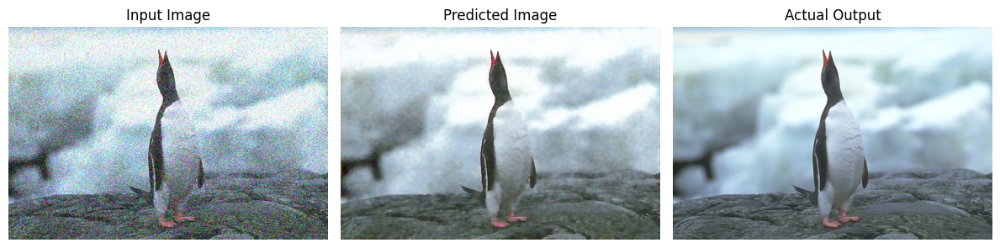

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


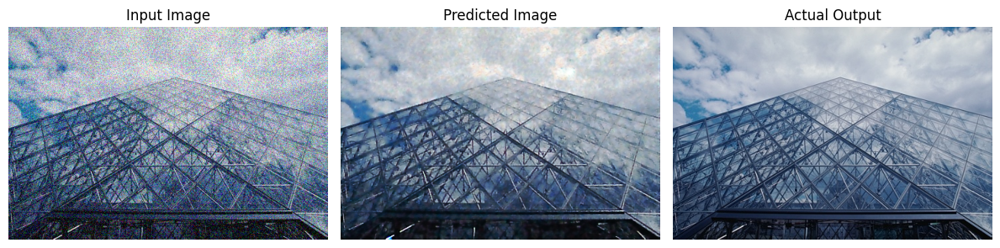

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


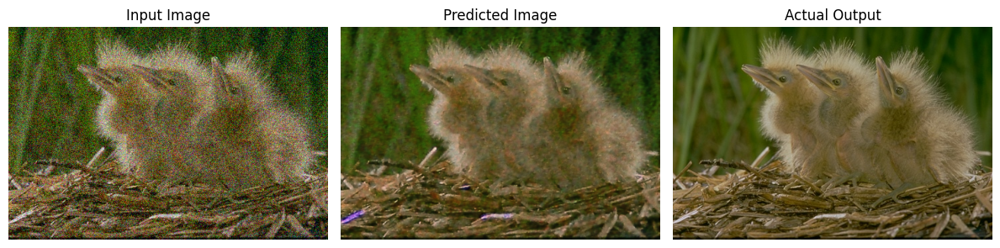

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


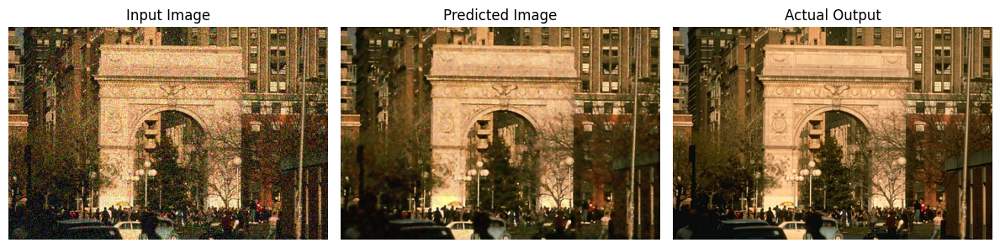

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


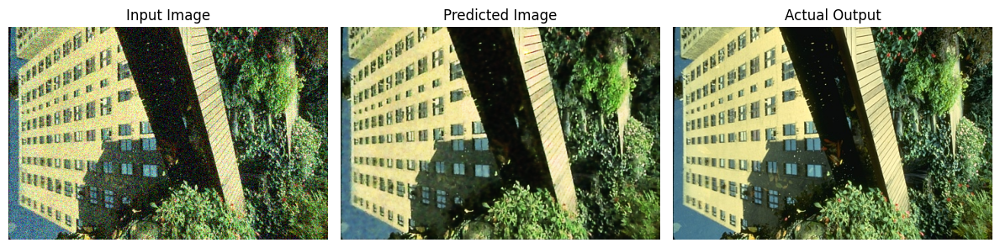

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


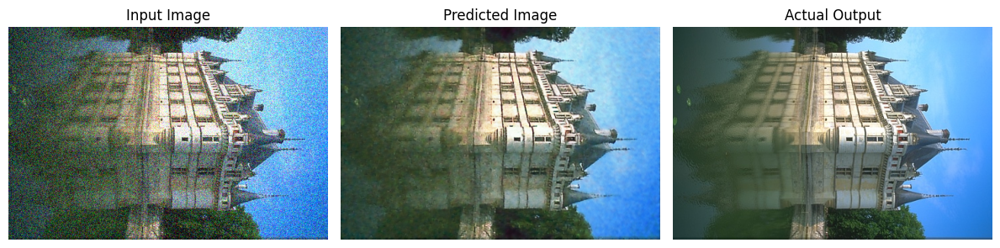

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


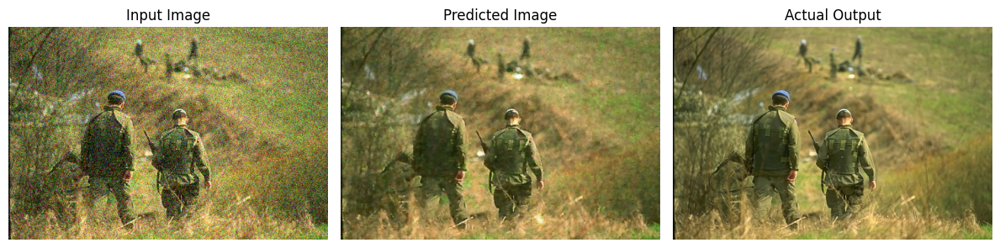

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


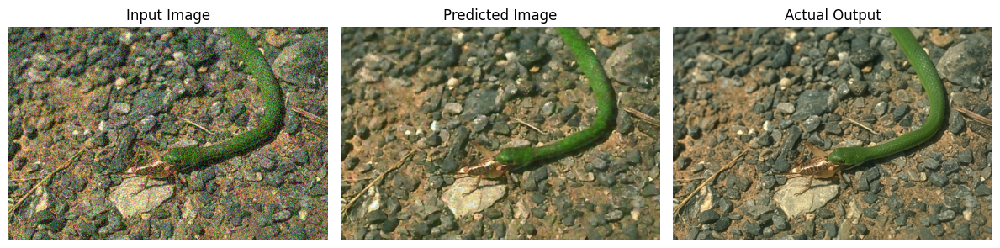

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


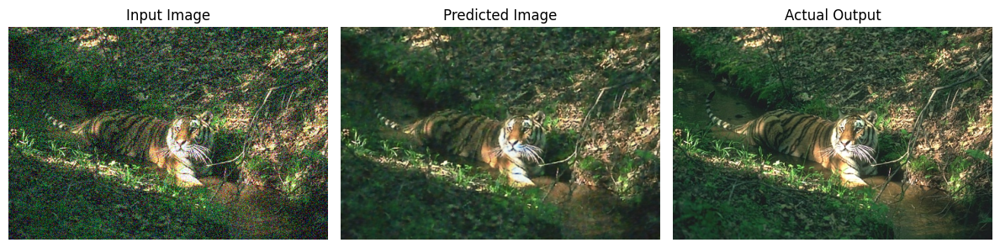

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


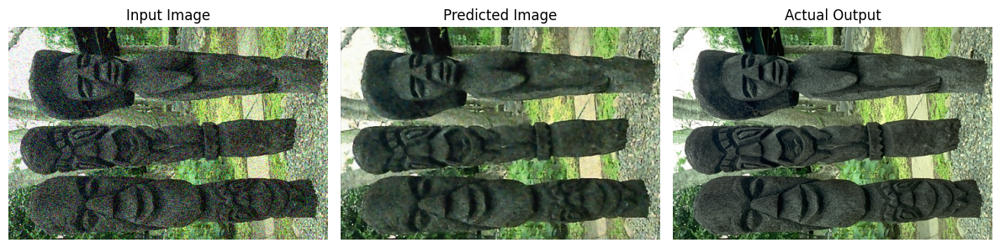

In [23]:
def show_image(index):
    input_img = blurry_images[index]
    output_img = original_images[index]
    predicted_img = model.predict(np.expand_dims(input_img, axis=0))[0]

    vmin = 0.0
    vmax = 1.0

    plt.figure(figsize=(12, 6))

    plt.subplot(131)
    plt.imshow(input_img, vmin=vmin, vmax=vmax)
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(predicted_img, vmin=vmin, vmax=vmax)
    plt.title("Predicted Image")
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(output_img, vmin=vmin, vmax=vmax)
    plt.title("Actual Output")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

for _ in range(10):
    show_image(random.randint(0, len(blurry_images) - 1))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


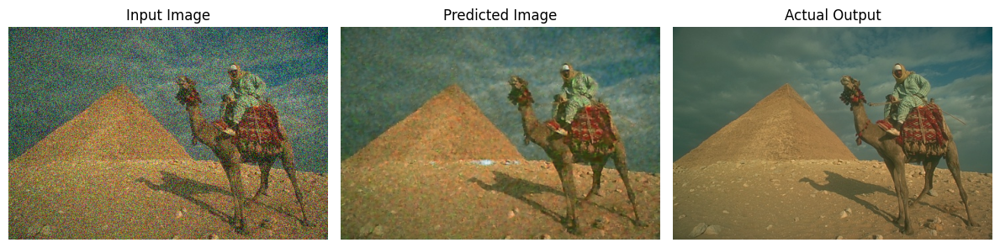

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


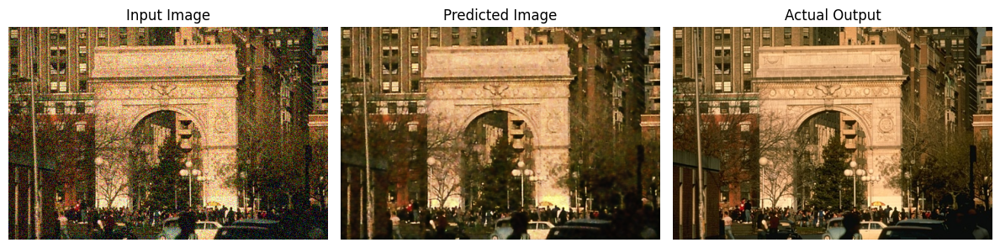

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


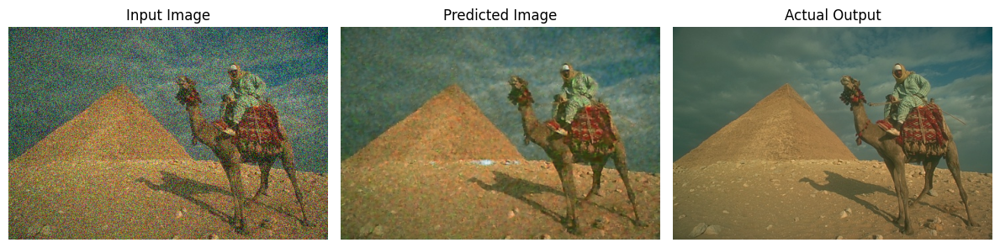

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


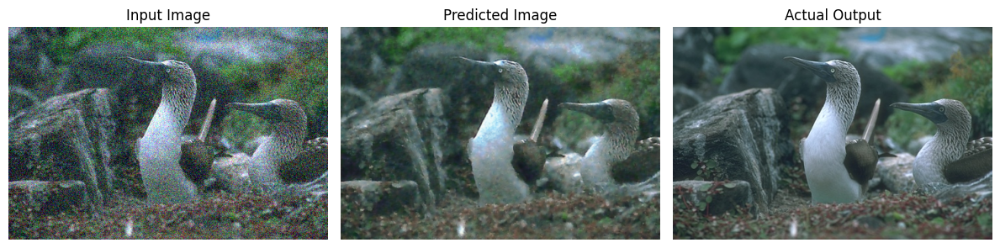

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


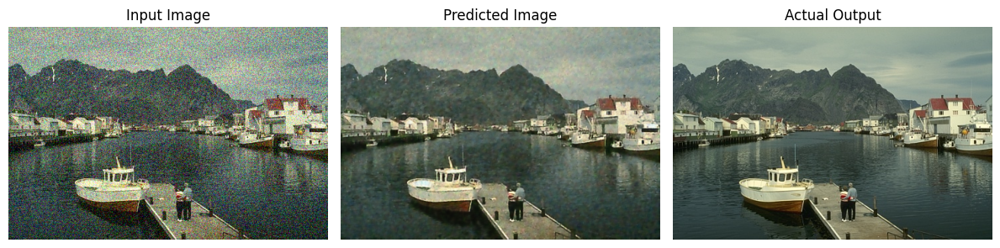

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


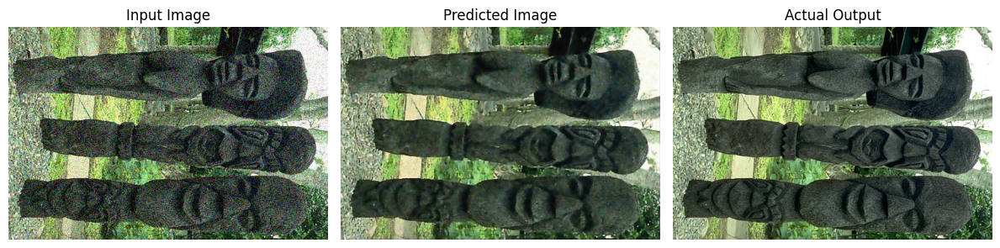

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


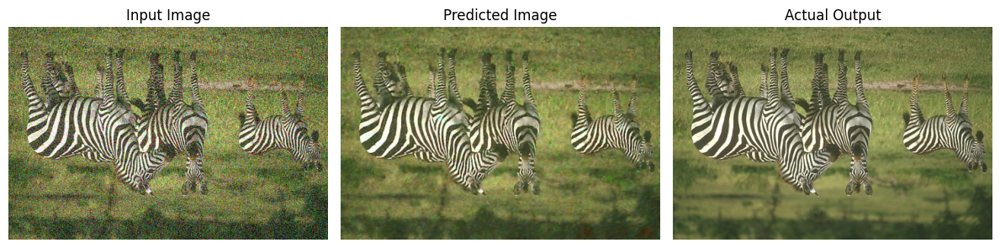

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


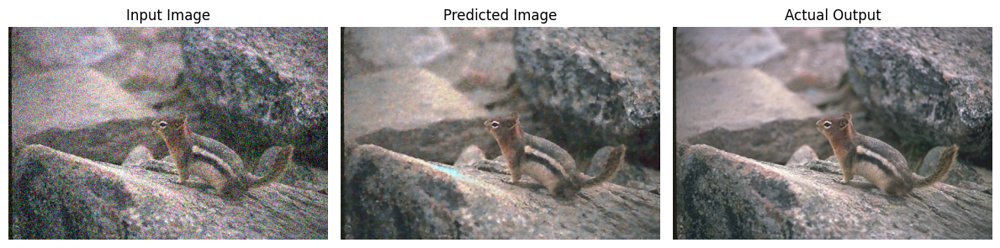

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


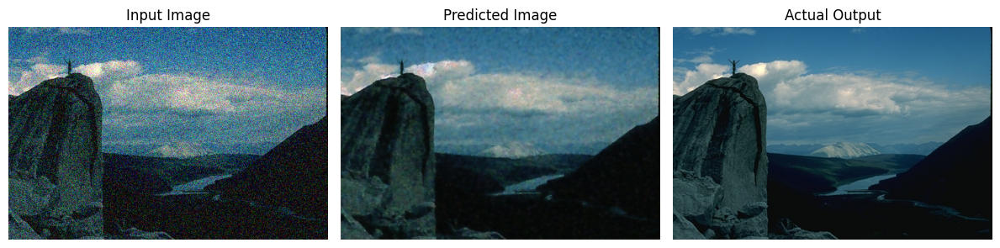

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


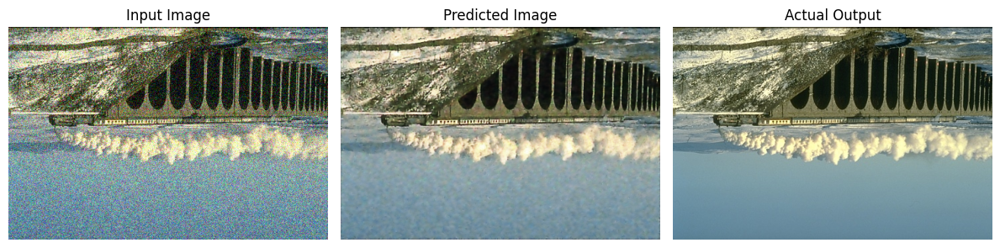

In [24]:
def show_image(index):
    input_img = blurry_images[index]
    output_img = original_images[index]
    predicted_img = model.predict(np.expand_dims(input_img, axis=0))[0]

    vmin = 0.0
    vmax = 1.0

    plt.figure(figsize=(12, 6))

    plt.subplot(131)
    plt.imshow(input_img, vmin=vmin, vmax=vmax)
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(predicted_img, vmin=vmin, vmax=vmax)
    plt.title("Predicted Image")
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(output_img, vmin=vmin, vmax=vmax)
    plt.title("Actual Output")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

for _ in range(10):
    show_image(random.randint(0, len(blurry_images) - 1))